<a href="https://colab.research.google.com/github/IlyaKo4atkov/MyProjects/blob/main/Electrical_Engineering_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Функция определения токов в обмотках

In [ ]:
!pip install numpy

Вектор токов I: [1.40751283-0.03545778j 0.70485567-0.13664073j 0.63250476-0.09554676j]
Матрица напряжения E: [77.24205937 79.20902383 93.53687778]
Матрица индуктивности L: [0.0043978  0.06683175 0.06952202]
Матрица энергии катушки индуктивности W: [0.00537442 0.01965975 0.08225179]
Матрица сопротивления нагрузок Rn: [43.62263636 80.98550052 86.28122852]
Матрица внутренних сопротивлений источника Rs: [10.27494411 23.86000152 43.82456445]


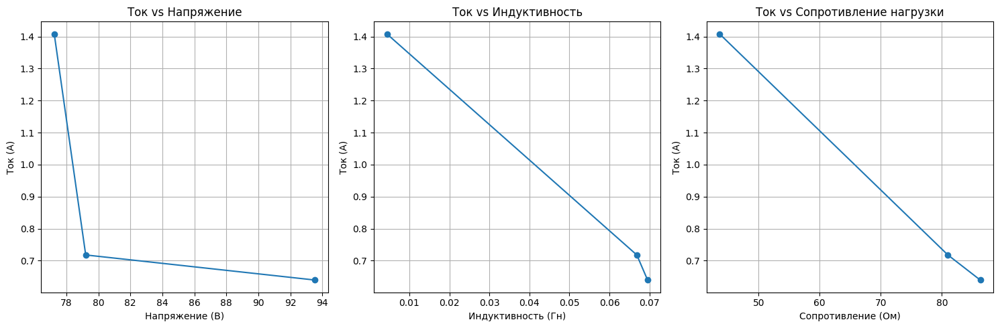

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

def calculate_currents():
    # Генерация случайных значений параметров из заданного диапазона через random.uniform
    d = random.uniform(0.001, 0.01)  # диаметр проводов обмоток в метрах
    p = 0.0167 #это справочное значение, поэтому остается как const
    l = random.uniform(0.1, 1.0)  # средняя длина витков в метрах
    u = random.uniform(1.0, 1000.0)  # относительная магнитная проницаемость
    u0 = 4 * np.pi * 1e-7  # магнитная проницаемость вакуума в Гн/м - это справочное значение
    S = random.uniform(0.0001, 0.01)  # поперечное сечение в м^2
    i = random.uniform(0.1, 0.5)  # длина магнитной силовой линии в метрах
    E = np.array([random.uniform(1, 100) for _ in range(3)])  # матрица напряжения в Вольтах
    E.sort() #Сортировка данных
    w = 2 * np.pi * 50  # частота в радианах в секунду (50 Гц)
    L = np.array([random.uniform(0.001, 0.1) for _ in range(3)])  # матрица индуктивности в Гн
    L.sort() #сортировка данных
    W = np.array([random.uniform(0.001, 0.1) for _ in range(3)])  # матрица энергии катушки индуктивности
    W.sort() #сортировка данных
    Rn = np.array([random.uniform(1, 100) for _ in range(3)])  # матрица с сопротивлением нагрузок в Ом
    Rn.sort() #сортировка данных
    Rs = np.array([random.uniform(1, 50) for _ in range(3)])  # матрица внутренних сопротивлений источника в Ом
    Rs.sort() #сортировка данных
    T = 1 / 50  # период в секундах
    # Вычисление магнитной проводимости
    y = u * u0 * (S / l)
    # Вычисление вектора токов I
    I = E / (1j * w * (L + y * W * W * T) + (Rs + Rn + (4 / np.pi) * d**-2 * W * p * i))
    return I, E, L, W, Rn, Rs

# Распаковка возвращаемых значений в отдельные переменные
I, E, L, W, Rn, Rs = calculate_currents()

# Печать каждого результата с его названием
print("Вектор токов I:", I)
print("Матрица напряжения E:", E)
print("Матрица индуктивности L:", L)
print("Матрица энергии катушки индуктивности W:", W)
print("Матрица сопротивления нагрузок Rn:", Rn)
print("Матрица внутренних сопротивлений источника Rs:", Rs)

# Построение графиков
plt.figure(figsize=(15, 5))

# График зависимости тока от напряжения
plt.subplot(1, 3, 1)
plt.plot(E, np.abs(I), 'o-')
plt.title('Ток vs Напряжение')
plt.xlabel('Напряжение (В)')
plt.ylabel('Ток (А)')
plt.grid()

# График зависимости тока от индуктивности
plt.subplot(1, 3, 2)
plt.plot(L, np.abs(I), 'o-') #модуль значений для корректного отображения
plt.title('Ток vs Индуктивность')
plt.xlabel('Индуктивность (Гн)')
plt.ylabel('Ток (А)')
plt.grid()

# График зависимости тока от сопротивления нагрузки
plt.subplot(1, 3, 3)
plt.plot(Rn, np.abs(I), 'o-')
plt.title('Ток vs Сопротивление нагрузки')
plt.xlabel('Сопротивление (Ом)')
plt.ylabel('Ток (А)')

plt.tight_layout()
plt.grid()
plt.show()

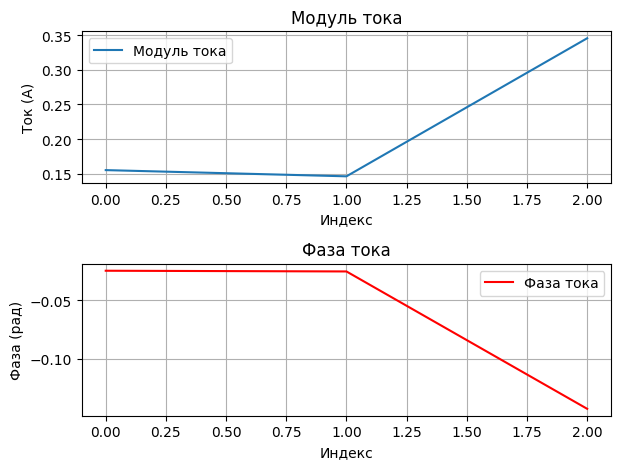

In [ ]:
# График модуля тока
plt.subplot(2, 1, 1)
plt.plot(np.abs(I), label='Модуль тока')
plt.xlabel('Индекс')
plt.ylabel('Ток (А)')
plt.title('Модуль тока')
plt.grid(True)
plt.legend()

# График фазы тока
plt.subplot(2, 1, 2)
plt.plot(np.angle(I), color='r', label='Фаза тока')
plt.xlabel('Индекс')
plt.ylabel('Фаза (рад)')
plt.title('Фаза тока')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

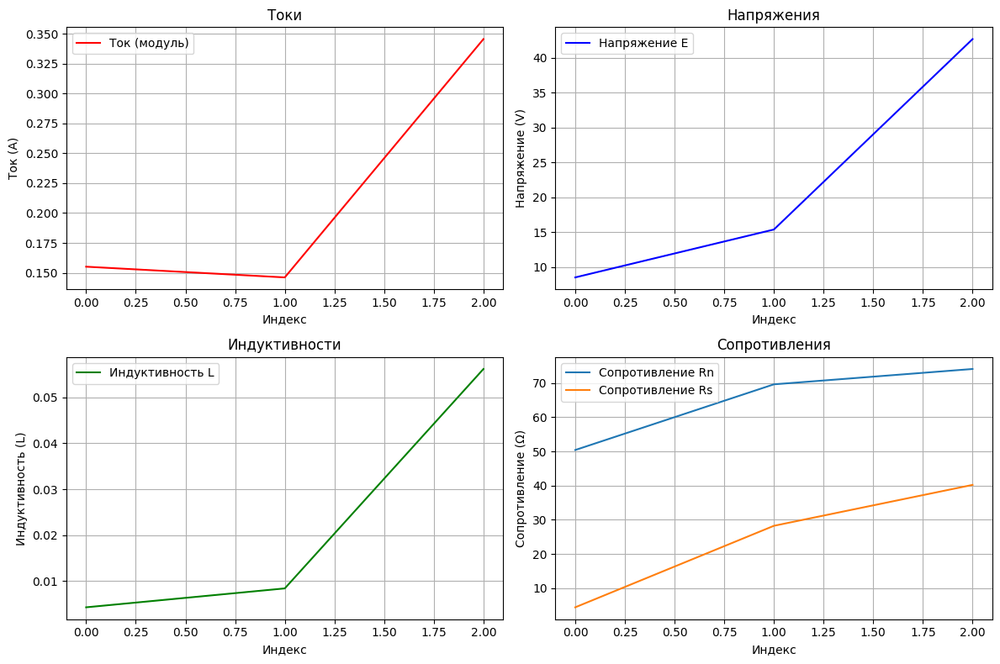

In [ ]:
# Построение графиков
plt.figure(figsize=(12, 8))

# График токов
plt.subplot(2, 2, 1)
plt.plot(np.abs(I), color='r', label='Ток (модуль)')
plt.title('Токи')
plt.xlabel('Индекс')
plt.ylabel('Ток (A)')
plt.grid()
plt.legend()

# График напряжений
plt.subplot(2, 2, 2)
plt.plot(E, color='b', label='Напряжение E')
plt.title('Напряжения')
plt.xlabel('Индекс')
plt.ylabel('Напряжение (V)')
plt.grid()
plt.legend()

# График индуктивностей
plt.subplot(2, 2, 3)
plt.plot(L, color='g', label='Индуктивность L')
plt.title('Индуктивности')
plt.xlabel('Индекс')
plt.ylabel('Индуктивность (L)')
plt.grid()
plt.legend()

# График сопротивлений
plt.subplot(2, 2, 4)
plt.plot(Rn, label='Сопротивление Rn')
plt.plot(Rs, label='Сопротивление Rs')
plt.title('Сопротивления')
plt.xlabel('Индекс')
plt.ylabel('Сопротивление (Ω)')
plt.grid()
plt.legend()

plt.tight_layout()
plt.show()

### Функция определения радиальной толщины обмоток

In [ ]:
import random
import numpy as np
def trrt(W, D, M):
  c = M[2]
  h = M[2]
  C = W * (D ** 2) / h #вектор радиальных толщин обмоток С
  cmax = np.sum(C) # общее количество обмоток
  uzap = (cmax <= c)
  '''логическая переменная uzap, принимающая истинное значение (True)
   в случае, если обмотки могуть разместиться в окне магнитопровода
   и ложное значение (False) в противном случае'''
  return uzap, C

# Данные для функции trrt
# Используем геометрическое распределение для генерации данных
p_W = 0.1  # вероятность для W
p_D = 0.5  # вероятность для D
p_M = 0.3  # вероятность для M
'''Функция `np.random.geometric(p, size)` из библиотеки NumPy
используется для генерации случайных чисел, распределённых по
геометрическому распределению. Геометрическое распределение
моделирует количество испытаний до первого успеха в серии
независимых испытаний, каждое из которых имеет вероятность
успеха `p`.'''
W = np.random.geometric(p_W, 3)  # вектор чисел витков в обмотках
D = np.random.geometric(p_D, 3)  # вектор диаметров проводов
M = np.random.geometric(p_M, 4)  # матрица размеров магнитопровода

uzap, C = trrt(W, D, M)  # выполнение функции
print("uzap:", uzap)  # вывод результата о размещении окна
for number in C:  # цикл для перебора элементов в матрице C
    print(f'{number:.2f}')

uzap: False
13.00
128.00
10.00


### Функция для определения средних длин витков

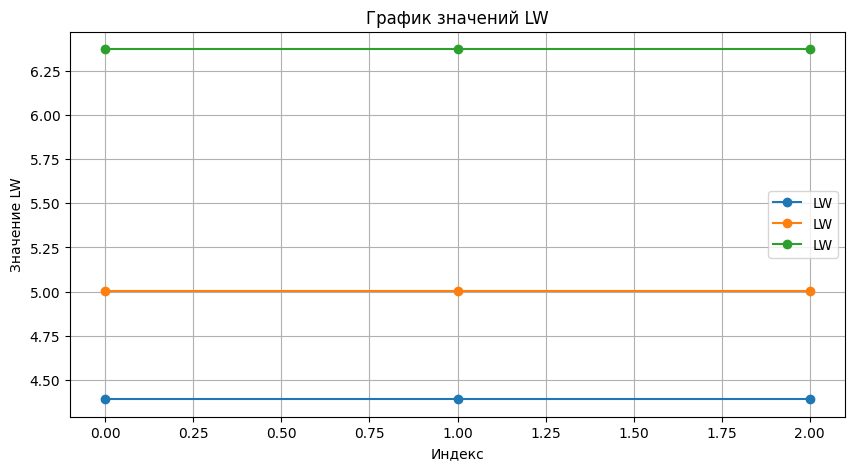

uzap: False
LW: [[4.39148987 5.00191706 6.37099852]
 [4.39148987 5.00191706 6.37099852]
 [4.39148987 5.00191706 6.37099852]]


In [ ]:
import matplotlib.pyplot as plt
def trsdv(W, D, M): #функция для возвращения значений
    n = len(W) #
    h = np.ones((n, 1)) # создание единичных матриц
    H = np.ones((n, n))
    uzap, C = trrt(W, D, M) #вызов функции для получения значения C и uzap
    a = 1  # размер обмотки по ширине
    b = 1  # размер обмотки по высоте
    LW = 2 * a * h + 2 * b * h + np.tril(H) @ C # оператор @ используется для матричного умножения
    return LW

# Входные данные
W = np.array([random.uniform(100, 200) for _ in range(3)]) #вектор чисел витков
W.sort()
D = np.array([random.uniform(1, 2) for _ in range(3)]) * 10**-2 # вектором диаметров проводов
D.sort()
M = np.array([random.uniform(1, 4) for _ in range(3)]) * 10**-2 # вектор размеров магнитопровода
M.sort()

LW = trsdv(W, D, M)

# Построение графика
plt.figure(figsize=(10, 5))
plt.plot(LW, label='LW', marker='o')
plt.title('График значений LW')
plt.xlabel('Индекс')
plt.ylabel('Значение LW')
plt.legend()
plt.grid(True)
plt.show()

print("uzap:", uzap)
print("LW:", LW)

### Визуализация данных

[[4.39148987 5.00191706 6.37099852]
 [4.39148987 5.00191706 6.37099852]
 [4.39148987 5.00191706 6.37099852]]
[4.39148987 5.00191706 6.37099852 4.39148987 5.00191706 6.37099852
 4.39148987 5.00191706 6.37099852]


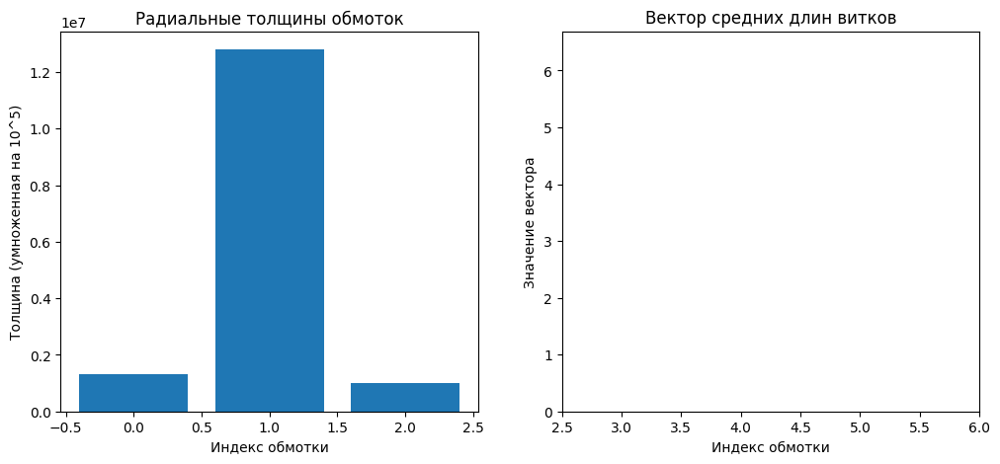

In [ ]:
plt.figure(figsize=(12, 5))

#Построение графика для радиальных толщин обмоток
plt.subplot(1, 2, 1)
plt.bar(range(len(C)), C * 100000) #умнажаем на 10^5 для лучшей визуализации
plt.title('Радиальные толщины обмоток')
plt.xlabel('Индекс обмотки')
plt.ylabel('Толщина (умноженная на 10^5)')

#Промежуточные данные
print(LW)
print(LW.flatten())

#График для значения LW
plt.subplot(1, 2, 2)
plt.bar(len(LW.flatten()), LW.flatten()) # преобразование в одномерный массив
plt.title('Вектор средних длин витков')
plt.xlabel('Индекс обмотки')
plt.ylabel('Значение вектора')
# Установка пределов для оси x
plt.xlim(2.5, 6) #установка ручного диапазона значений на графике
plt.show()



### Функция определения активных сопротивлений обмоток

In [ ]:
def trrob(W, D, M):
  LW = trsdv(W, D, M)
  DD = np.diag(D) #команда для создания диагональной матрицы
  WD = np.diag(W) #
  LWD = np.diag(LW) #
  n = len(W)
  ROD = 0.0168 * 10**-1 * np.eye(n) # размерность Ом * м
  RW = np.linalg.inv(DD) @ WD @ ROD @ LWD * 4 / np.pi
  return RW

#Генерация входных данные
W = np.array([random.uniform(100, 200) for _ in range(3)]) #вектор чисел витков
W.sort()
D = np.array([random.uniform(1, 2) for _ in range(3)]) * 10**-3 # вектором диаметров проводов
D.sort()
M = np.array([random.uniform(1, 4) for _ in range(3)]) * 10**-1 # вектор размеров магнитопровода
M.sort()

# Вычисление
LW = trsdv(W, D, M)
RW = trrob(W, D, M)

print("LW:", LW)
print("RW:", RW)

LW: [[4.00028194 4.00139421 4.00265116]
 [4.00028194 4.00139421 4.00265116]
 [4.00028194 4.00139421 4.00265116]]
RW: [868.42303738 803.6217904  887.00179779]


Text(0, 0.5, 'Значение')

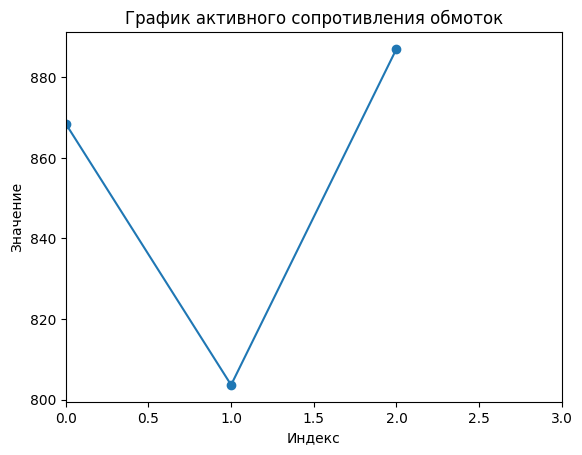

In [ ]:
# График для RW
plt.subplot(1, 1, 1)
plt.plot(RW, 'o-')
plt.xlim(0, 3)
plt.title('График активного сопротивления обмоток')
plt.xlabel('Индекс')
plt.ylabel('Значение')

### Функция определения комплексных сопротивлений цепей

In [ ]:
import numpy as np

def trz(RS, RN, RO, f, L, C):
    # Комплексное число j в Python обозначается как 1j
    omega = 1j * 2 * np.pi * f

    # Суммируем массивы RS, RN и RO
    R = np.array(RS) + np.array(RN) + np.array(RO)

    # Преобразуем L и C в массивы NumPy
    L = np.array(L)
    C = np.array(C)

    # Создаем диагональные матрицы из массивов R, L и C
    RD = np.diag(R)
    LD = np.diag(L)
    CD = np.diag(C)

    # Вычисляем Z
    Z = RD + 1j * omega * LD + np.linalg.inv(CD) / (1j * omega)

    return Z

# Генерация входных данных
RS = np.array([random.uniform(1, 3) for _ in range(3)])
RS.sort()
RN = np.array([random.uniform(1, 3) for _ in range(3)])
RN.sort()
RO = np.array([random.uniform(1, 3) for _ in range(3)])
RO.sort()
f = 50  # Частота
L = np.array([random.uniform(0.1, 0.3) for _ in range(3)])
L.sort()
C = np.array([random.uniform(0.01, 0.03) for _ in range(3)])
C.sort()

Z = trz(RS, RN, RO, f, L, C)
print(Z)

[[-61.96576255+0.j   0.        +0.j   0.        +0.j]
 [  0.        +0.j -68.24091883+0.j   0.        +0.j]
 [  0.        +0.j   0.        +0.j -72.09470152+0.j]]


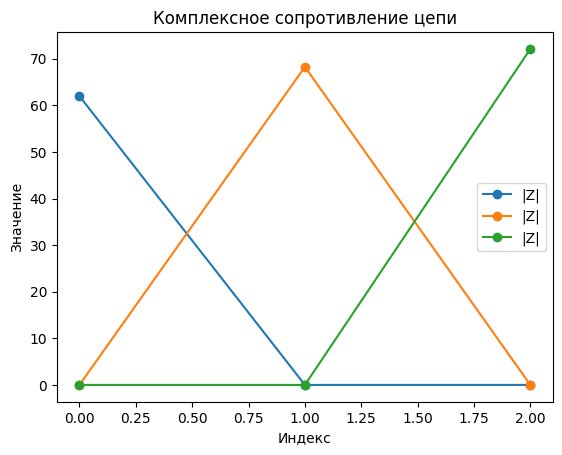

In [ ]:
# График для Z (модуль комплексного числа)
plt.subplot(1, 1, 1)
plt.plot(np.abs(Z), 'o-', label='|Z|')  # Добавляем метку для линии
plt.title('Комплексное сопротивление цепи')
plt.xlabel('Индекс')
plt.ylabel('Значение')

plt.legend()  # Отображаем легенду

plt.show()

### Функция потерь трансформатора

<ipython-input-3-e438ebb1882e>:18: ComplexWarning: Casting complex values to real discards the imaginary part
  losses = np.random.normal(loc=mean_loss, scale=0.02, size=n_points) * input_power


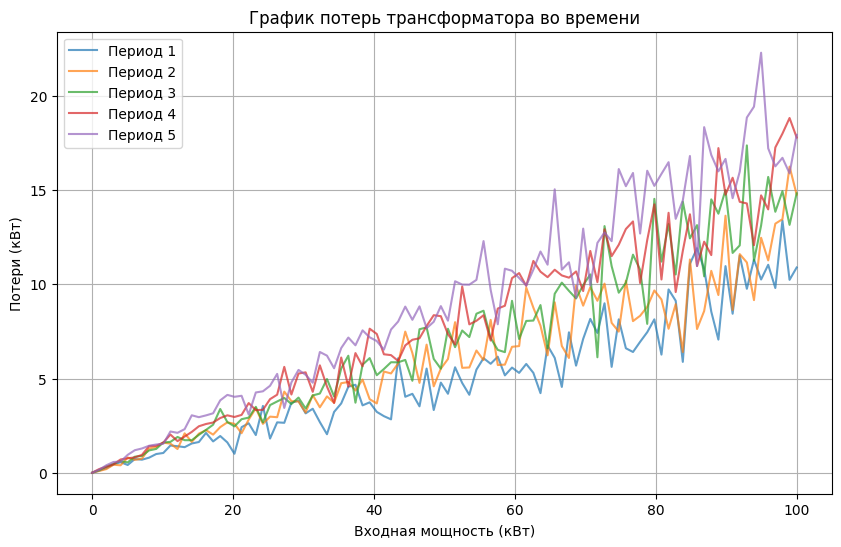

In [ ]:

import numpy as np
import matplotlib.pyplot as plt

# Устанавливаем начальное значение для генератора случайных чисел
np.random.seed(0)

# Параметры
n_points = 100  # Количество точек данных
n_time_steps = 5  # Количество временных шагов

# Генерация данных для каждого временного шага
input_power = np.linspace(0, 100, n_points)
losses_over_time = []

for t in range(n_time_steps):
    # Изменяем среднее значение потерь со временем, используя значения тока I
    mean_loss = 0.1 + 0.02 * t + I.mean() * 0.001
    losses = np.random.normal(loc=mean_loss, scale=0.02, size=n_points) * input_power
    losses_over_time.append(losses)

# Построение графиков для каждого временного шага
plt.figure(figsize=(10, 6))
for t, losses in enumerate(losses_over_time):
    plt.plot(input_power, losses, label=f'Период {t + 1}', alpha=0.7)


plt.title('График потерь трансформатора во времени')
plt.xlabel('Входная мощность (кВт)')
plt.ylabel('Потери (кВт)')
plt.grid(True)
plt.legend()
plt.show()

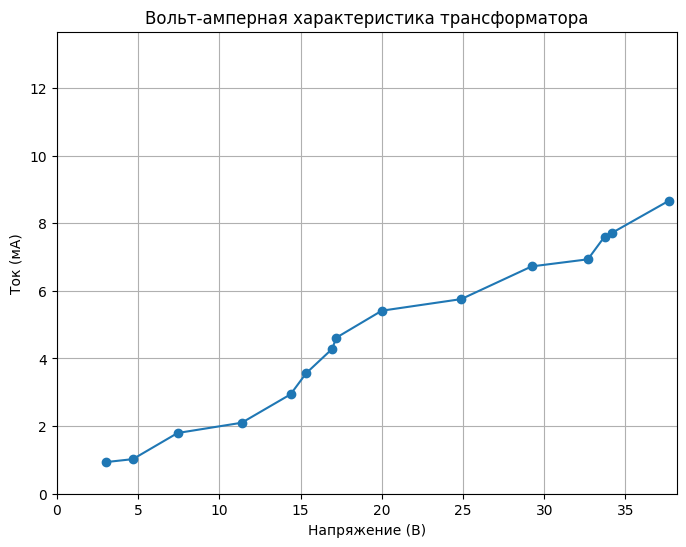

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import numpy as np
from IPython.display import HTML
import random

# Генерация возрастающего массива напряжения
voltage_increments = np.array([random.uniform(0.1, 5) for _ in range(15)])
#генерация случайных значений и дальнейшее преобразование в вектор
voltage = np.cumsum(voltage_increments)
# приводим сгенерированные данные к возрастающему вектору

# Генерация возрастающего массива тока
current_increments = np.array([random.uniform(0.01, 1) for _ in range(15)])
#генерация случайных значений и дальнейшее преобразование в вектор
current = np.cumsum(current_increments)
# приводим сгенерированные данные к возрастающему вектору

# Создание фигуры и осей
fig, ax = plt.subplots(figsize=(8, 6))
line, = ax.plot([], [], marker='o', linestyle='-')
ax.set_xlim(0, max(voltage) + 0.5)
ax.set_ylim(0, max(current) + 5)
ax.set_title('Вольт-амперная характеристика трансформатора')
ax.set_xlabel('Напряжение (В)')
ax.set_ylabel('Ток (мА)')
ax.grid(True) #отображение сетки

# Функция инициализации
def init():
    line.set_data([], [])
    return line,

# Функция анимации
def animate(i):
    x = voltage[:i]
    y = current[:i]
    line.set_data(x, y)
    return line,

# Создание анимации
ani = FuncAnimation(fig, animate, init_func=init, frames=len(voltage) + 1, interval=500, blit=True)
#встроенная функция для построения анимации

# Отображение анимации
HTML(ani.to_jshtml())


### Зависимость КПД трансформатора от характера нагрузки

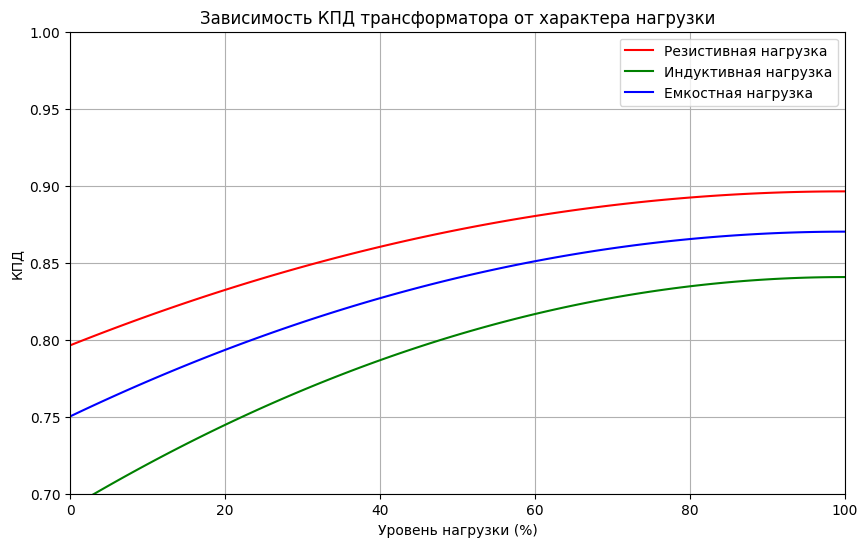

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
%matplotlib inline
from IPython.display import HTML

# Пример данных
time_steps = 50  # количество временных шагов
load_levels = np.linspace(0, 100, 100)  # массив из 100 значений, равномерно распределенных от 0 до 100

# Функция для генерации данных КПД в зависимости от времени
def generate_efficiency_data(time):
    efficiency_resistive = 0.9 - 0.1 * (1 - load_levels / 100)**2 + 0.01 * np.sin(time / 5)
    efficiency_inductive = 0.85 - 0.15 * (1 - load_levels / 100)**2 + 0.01 * np.cos(time / 5)
    efficiency_capacitive = 0.88 - 0.12 * (1 - load_levels / 100)**2 + 0.01 * np.sin(time / 10)
    return efficiency_resistive, efficiency_inductive, efficiency_capacitive

# Настройка графика
fig, ax = plt.subplots(figsize=(10, 6))
ax.set_title('Зависимость КПД трансформатора от характера нагрузки')
ax.set_xlabel('Уровень нагрузки (%)')
ax.set_ylabel('КПД')
ax.set_xlim(0, 100) # настраиваемый масштаб
ax.set_ylim(0.7, 1.0) #настраиваемый мастаб
ax.grid(True)

line_resistive, = ax.plot([], [], label='Резистивная нагрузка', color='r') #отображение графиков
line_inductive, = ax.plot([], [], label='Индуктивная нагрузка', color='g') #отображение графиков
line_capacitive, = ax.plot([], [], label='Емкостная нагрузка', color='b') #отображение графиков
ax.legend() #отображение легенды

# Функция инициализации
def init():
    line_resistive.set_data([], [])
    line_inductive.set_data([], [])
    line_capacitive.set_data([], [])
    return line_resistive, line_inductive, line_capacitive

# Функция анимации
def animate(time):
    efficiency_resistive, efficiency_inductive, efficiency_capacitive = generate_efficiency_data(time)
    line_resistive.set_data(load_levels, efficiency_resistive) #изменение значений
    line_inductive.set_data(load_levels, efficiency_inductive) #изменение значений
    line_capacitive.set_data(load_levels, efficiency_capacitive) #изменение значений
    return line_resistive, line_inductive, line_capacitive

# Создание анимации
ani = FuncAnimation(fig, animate, frames=time_steps, init_func=init, blit=True, interval=200)

#Команда отображения анимации в Colab
HTML(ani.to_jshtml())


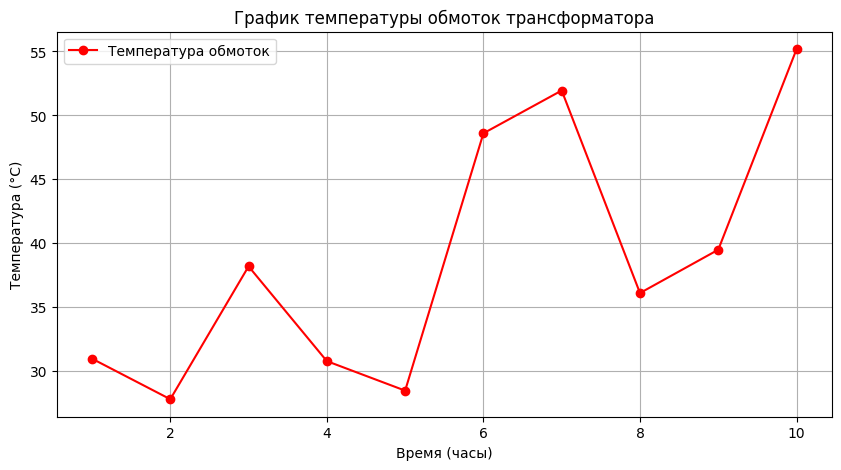

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random


# Время (например, в часах)
time = np.array([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])

# Температура (например, в градусах Цельсия)
temperature = np.array([random.uniform(20, 60) for _ in range(10)])
#генерация случайных данных из указанного диапазона


# Создание графика
plt.figure(figsize=(10, 5))
plt.plot(time, temperature, marker='o', linestyle='-',
         color='r', label='Температура обмоток')

# Добавление заголовка и меток осей
plt.title('График температуры обмоток трансформатора')
plt.xlabel('Время (часы)')
plt.ylabel('Температура (°C)')

# Добавление сетки
plt.grid(True)

# Добавление легенды
plt.legend()

# Показ графика
plt.show()


### Функция степни насыщения магнитопровода

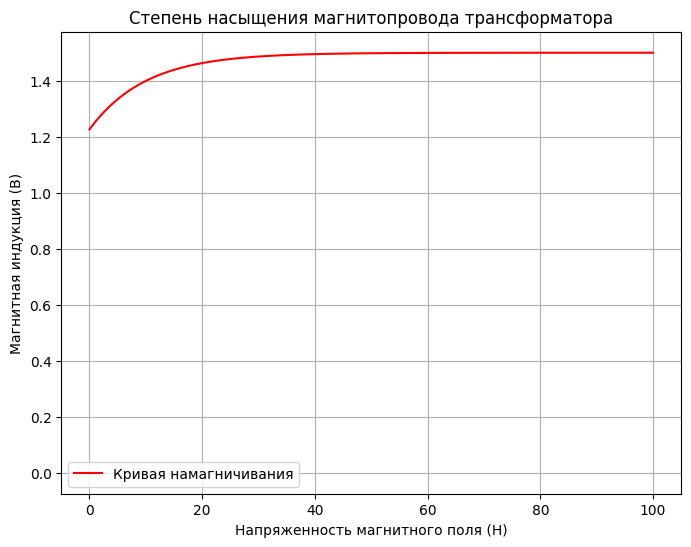

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.animation as animation
from IPython.display import HTML

# Создаем фигуру и оси
fig, ax = plt.subplots(figsize=(8, 6))

# Генерируемые данные для магнитной индукции (B) и напряженности магнитного поля (H)
H = np.linspace(0, 100, 500)
# напряженность магнитного поля
B = 1.5 * (1 - np.exp(-0.1 * H))
# зависимость B от H в виде экспоненциальной функции

# Инициализация графика
line, = ax.plot(H, B, label='Кривая намагничивания', color='r')
ax.set_title('Степень насыщения магнитопровода трансформатора')
ax.set_xlabel('Напряженность магнитного поля (H)')
ax.set_ylabel('Магнитная индукция (B)')
ax.grid(True)
ax.legend()

# Функция для обновления данных на графике
def update(frame):
    # Генерируем случайное число в диапазоне, от 0 до 0.2
    random_increment = np.random.uniform(0, 0.2)
    # Изменяем напряженность магнитного поля на случайное число
    H_new = H + frame * random_increment
    B_new = 1.5 * (1 - np.exp(-0.1 * H_new))
    line.set_ydata(B_new)
    return line,

# Создаем анимацию
ani = animation.FuncAnimation(fig, update, frames=np.arange(0, 100), blit=True, interval=100)

#Команда отображения анимации в Colab
HTML(ani.to_jshtml())

### Функция себестоимости трансформатора

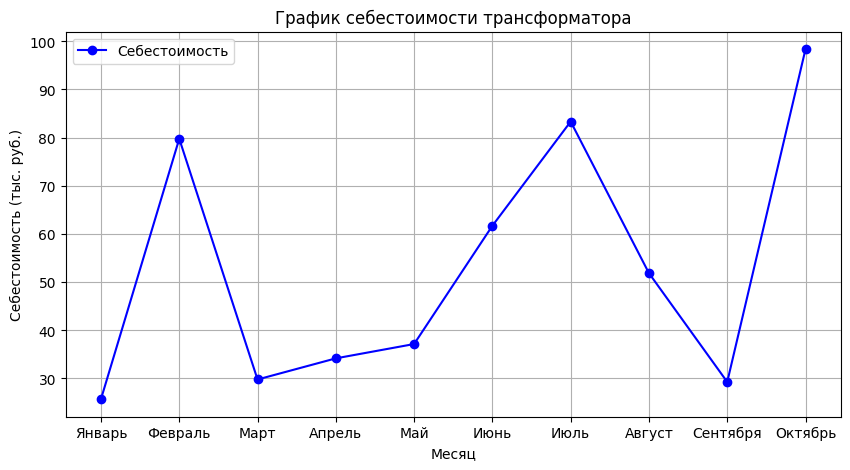

In [ ]:
import matplotlib.pyplot as plt

# Пример данных о себестоимости трансформатора
# Даты (например, месяцы)
dates = ['Январь', 'Февраль', 'Март', 'Апрель',
         'Май', 'Июнь', 'Июль', 'Август', 'Сентября', 'Октябрь']

# Сгенерированные данные себестоимость в тысячах рублей
costs = [random.uniform(10, 100) for _ in range(10)]

# Построение графика
plt.figure(figsize=(10, 5))
plt.plot(dates, costs, marker='o', linestyle='-',
         color='b', label='Себестоимость')

# Добавление заголовка и подписей к осям
plt.title('График себестоимости трансформатора')
plt.xlabel('Месяц')
plt.ylabel('Себестоимость (тыс. руб.)')

# Добавление сетки
plt.grid(True)

# Добавление легенды
plt.legend()

# Показать график
plt.show()

### Функция влияния допусков на входные параметры транформатора

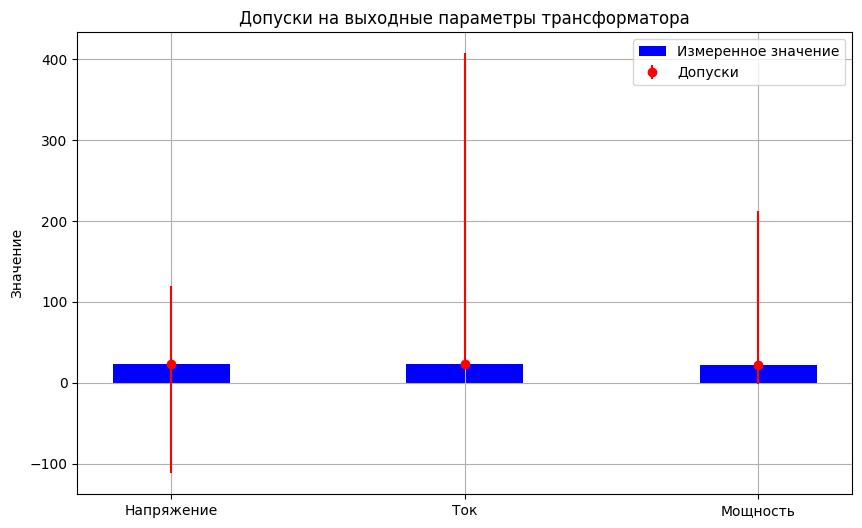

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Данные для анализа
parameters = ['Напряжение', 'Ток', 'Мощность']

# Создание фигуры и осей
fig, ax = plt.subplots(figsize=(10, 6))

# Функция для обновления данных
def update(frame):
    ax.clear()  # Очистка текущих осей
    measured_values = np.array([random.uniform(10, 50) for _ in range(3)])  # Измеренные значения
    lower_limits = np.array([random.uniform(20, 200) for _ in range(3)])   # Нижние пределы
    upper_limits = np.array([random.uniform(100, 500) for _ in range(3)])   # Верхние пределы

    # Построение столбцов для каждого параметра
    for i, parameter in enumerate(parameters):
        ax.bar(i, measured_values[i], color='blue', width=0.4,
               label='Измеренное значение' if i == 0 else "")
        ax.errorbar(i, measured_values[i],
                    yerr=[[abs(measured_values[i] - lower_limits[i])], [abs(upper_limits[i] - measured_values[i])]],
                    fmt='o', color='red', label='Допуски' if i == 0 else "")

    # Настройка осей и заголовков
    ax.set_xticks(range(len(parameters)))
    ax.set_xticklabels(parameters)
    ax.set_ylabel('Значение')
    ax.set_title('Допуски на выходные параметры трансформатора')
    ax.legend()
    ax.grid(True)

# Создание анимации
ani = FuncAnimation(fig, update, frames=range(10), repeat=True)

# Команда отображения анимации в Jupyter Notebook
HTML(ani.to_jshtml())

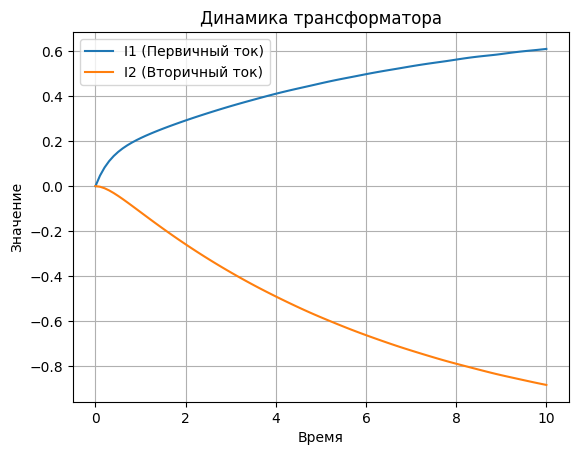

In [ ]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
import random
# Определяем функции, описывающие систему
def transformer_dynamics(t, y, L1, L2, M, R1, R2, V1):
    I1, I2 = y
    dI1_dt = (V1 - R1 * I1 - M * I2) / L1
    dI2_dt = (-R2 * I2 - M * I1) / L2
    return [dI1_dt, dI2_dt]

#Сгенерированные параметры системы
L1 = random.uniform(0, 2)  # Индуктивность первичной обмотки
L2 = random.uniform(0, 2)# Индуктивность вторичной обмотки
M = random.uniform(0, 2)   # Взаимная индуктивность
R1 = random.uniform(0, 2) # Сопротивление первичной обмотки
R2 = random.uniform(0, 2)  # Сопротивление вторичной обмотки
V1 = random.uniform(0, 2)  # Напряжение на первичной обмотке

# Начальные условия
I1_0 = 0.0
I2_0 = 0.0

# Временной интервал
t_span = (0, 10)
t_eval = np.linspace(t_span[0], t_span[1], 100)
'''linspace- создание одномерного массива чисел,
равномерно распределённых между заданными
начальной и конечной точками'''

# Решение системы
solution = solve_ivp(transformer_dynamics, t_span,
 [I1_0, I2_0], args=(L1, L2, M, R1, R2, V1), t_eval=t_eval)
'''`solve_ivp` из библиотеки SciPy для численного решения
системы обыкновенных дифференциальных уравнений.
Она позволяет решать уравнения на заданном
интервале времени с заданными начальными условиями.
t_span-кортеж начального и конечного времени интегрирования
args-дополнительные параметры
t_eval-массив времени, необходимый для вычисления
'''

# Построение графиков
plt.plot(solution.t, solution.y[0], label='I1 (Первичный ток)')
plt.plot(solution.t, solution.y[1], label='I2 (Вторичный ток)')
plt.xlabel('Время')
plt.ylabel('Значение')
plt.title('Динамика трансформатора')
plt.legend()
plt.grid()
plt.show()